For this project, you’ll utilize the 60-year weather data comprising temperature and precipitation to investigate and examine climate change patterns spanning a 60-year timeframe from 1960 to 2020. Additionally, you will employ Prophet, an open-source time series forecasting library created by Facebook’s Core Data Science team, to forecast weather conditions for the upcoming five years.

The dataset provides daily temperature and precipitation data for 210 US cities from before the 1900s. The dataset comprises the following columns:

Date: This is the date of the temperature recording in YYYY-MM-DD format.

tmax: This is the daily maximum temperature in Fahrenheit (°F).

tmin: This is the daily minimum temperature in Fahrenheit (°F).

prcp: This is the daily precipitation amount in inches (in).

However, for the tasks in this project, the following columns have been added to the dataset:

City: This is the name of the city.

Year: This is the year of the temperature recording.

Month: This is the month of the temperature recording.

tavg: This is the daily average temperature in Fahrenheit (°F).

Note: In this project, we’ll only use the weather data for five cities (Boston, Chicago, Los Angeles, New York, and Washington DC) for a period of 60 years from 1960 to 2020. The final dataset file, named Dataset.csv, has been provided to you. Visit the KiltHub repository to access the complete dataset.



In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import pandas as pd
import seaborn as sns
import prophet as pp
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from prophet import Prophet

In [4]:
file_path = "/content/drive/My Drive/Colab Notebooks/Dataset.csv"
df = pd.read_csv(file_path)
df.head()

,Date,tmax,tmin,prcp,City,Year,Month,tavg
0,1960-01-01,37.0,24.0,0.00,Boston,1960,Jan,30.5
1,1960-01-02,47.0,23.0,0.00,Boston,1960,Jan,35.0
2,1960-01-03,57.0,37.0,0.92,Boston,1960,Jan,47.0
3,1960-01-04,41.0,33.0,0.00,Boston,1960,Jan,37.0
4,1960-01-05,37.0,27.0,0.00,Boston,1960,Jan,32.0


In [5]:
df['Date'] = pd.to_datetime(df['Date'])

In [6]:
print(df['City'].unique())

['Boston' 'Chicago' 'Los Angeles' 'New York' 'Washington DC']


In [7]:
cities = df['City'].unique()

In this task, you’ll display an overview of how the temperatures have changed over the last six decades by plotting a separate graph for each city. This allows you to visualize if the average temperatures have changed over the decades. The plots also allow a comparative analysis among the different cities.



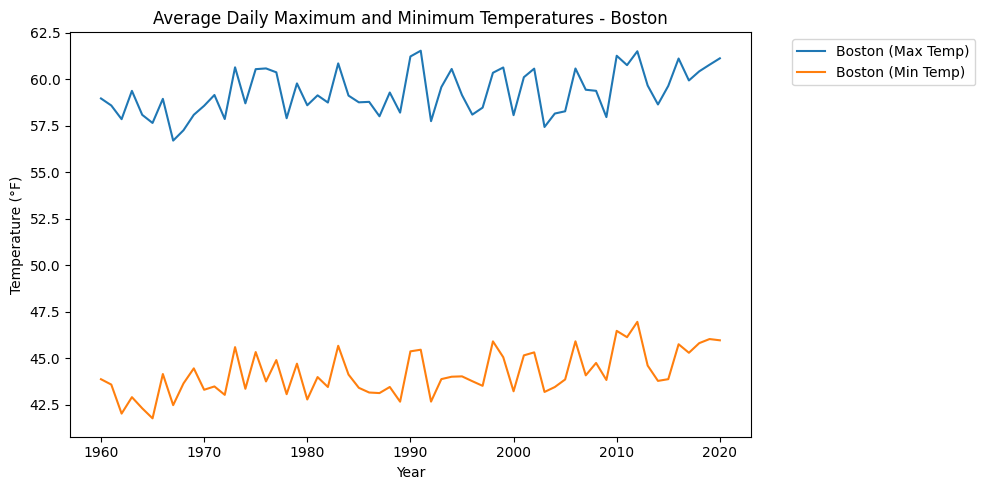

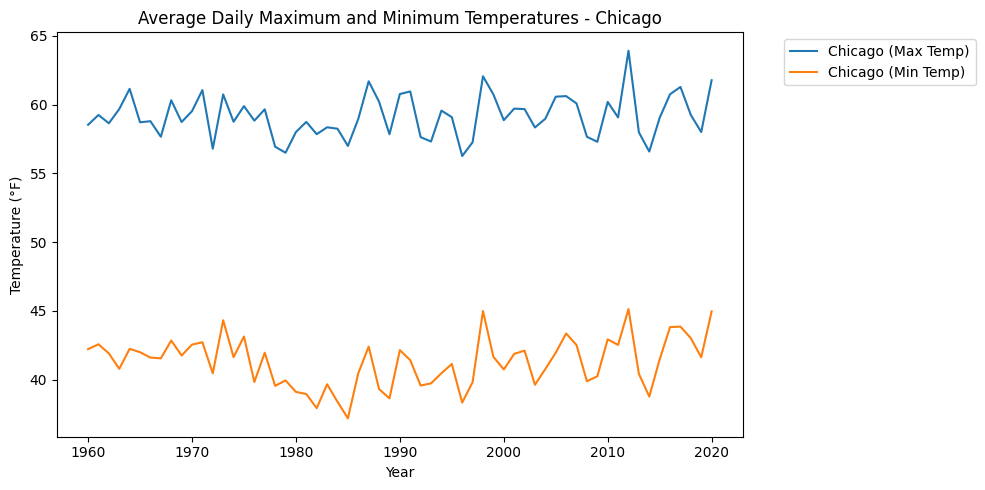

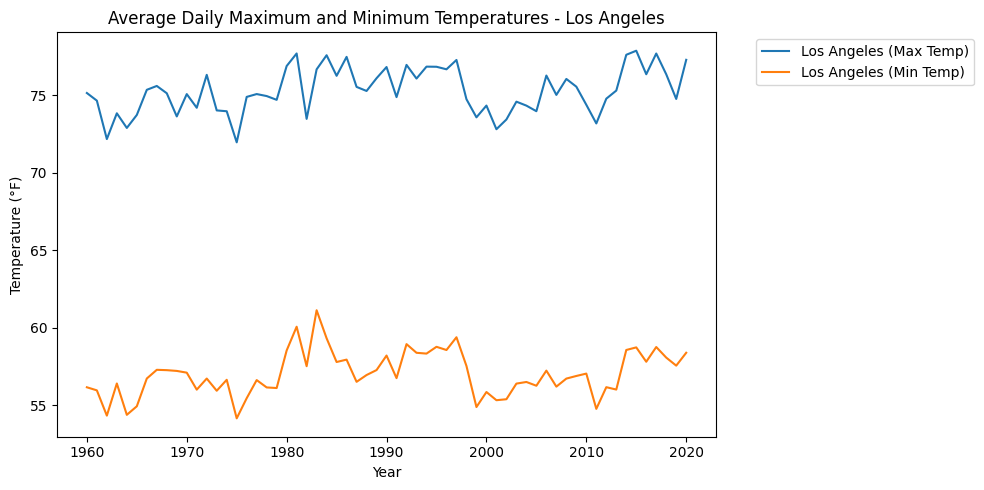

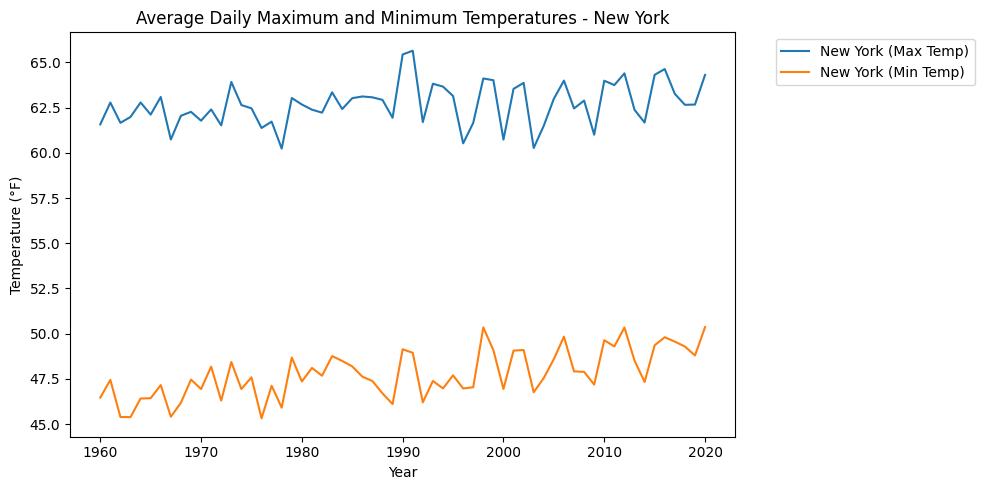

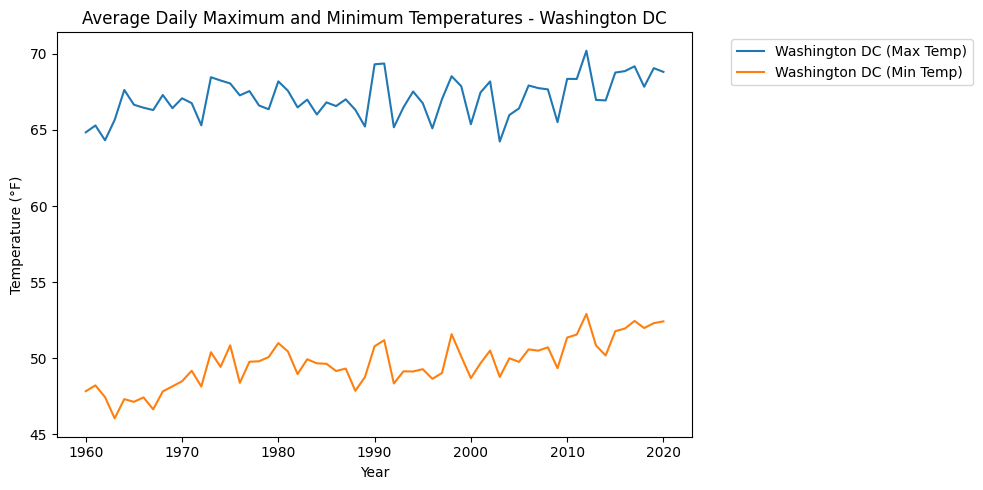

In [9]:
for city in cities:
    fig, ax = plt.subplots(figsize=(10,5))
    city_data = df[df['City'] == city]

    avg_max_temps = city_data.groupby(df['Year'])['tmax'].mean()
    avg_min_temps = city_data.groupby(df['Year'])['tmin'].mean()

    ax.plot(avg_max_temps.index, avg_max_temps, label=f'{city} (Max Temp)')
    ax.plot(avg_min_temps.index, avg_min_temps, label=f'{city} (Min Temp)')

    ax.set_xlabel('Year')
    ax.set_ylabel('Temperature (°F)')
    ax.set_title(f'Average Daily Maximum and Minimum Temperatures - {city}')

    # Move the legend outside the graph and prevent it from overlapping
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Adjust the layout to make room for the legend
    fig.tight_layout()

    # Show the graph
    plt.show()

In [10]:
avg_max_temps = city_data.groupby(df['Year'])['tmax'].mean()
print(avg_max_temps)

Year
1960    64.841530
1961    65.290411
1962    64.320548
1963    65.657534
1964    67.625683
          ...    
2016    68.863388
2017    69.180822
2018    67.836438
2019    69.059452
2020    68.812295
Name: tmax, Length: 61, dtype: float64


In [12]:
city_data['Decade'] = city_data['Year'] // 10 * 10
avg_by_decade = city_data.groupby(['Decade', 'Month']).mean(numeric_only=True).reset_index()
print(avg_by_decade)

    Decade Month       tmax       tmin      prcp       Year       tavg
0     1960   Apr  66.553333  45.406667  0.078900  1964.5000  55.980000
1     1960   Aug  86.380645  67.851613  0.149355  1964.5000  77.116129
2     1960   Dec  43.945161  28.667742  0.102161  1964.5000  36.306452
3     1960   Feb  43.883392  27.537102  0.101307  1964.4947  35.710247
4     1960   Jan  42.154839  26.309677  0.080323  1964.5000  34.232258
..     ...   ...        ...        ...       ...        ...        ...
79    2020   Mar  62.054839  44.280645  0.074516  2020.0000  53.167742
80    2020   May  72.335484  55.206452  0.080323  2020.0000  63.770968
81    2020   Nov  63.193333  45.440000  0.204667  2020.0000  54.316667
82    2020   Oct  69.848387  53.890323  0.156774  2020.0000  61.869355
83    2020   Sep  77.973333  62.393333  0.184333  2020.0000  70.183333

[84 rows x 7 columns]


<ipython-input-12-ead462656e7f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  city_data['Decade'] = city_data['Year'] // 10 * 10


In [13]:
#index='Decade' → Dữ liệu sẽ được nhóm theo thập kỷ.
#columns='Month' → Mỗi cột sẽ là một tháng trong năm.
#values='tavg' → Giá trị trong bảng là nhiệt độ trung bình (tavg).
pivot_table = avg_by_decade.pivot(index='Decade', columns='Month', values='tavg')
print(pivot_table)

Month         Apr        Aug        Dec        Feb        Jan        Jul  \
Decade                                                                     
1960    55.980000  77.116129  36.306452  35.710247  34.232258  78.311290   
1970    56.585000  78.503226  41.446774  37.515957  34.785484  78.903226   
1980    56.643333  78.159677  38.932258  38.565371  34.009677  80.314516   
1990    56.808333  77.985484  41.461290  40.035461  37.917742  80.635484   
2000    57.180000  78.770968  39.416129  38.765018  36.600000  78.482258   
2010    59.143000  79.626613  42.880645  40.202660  36.784194  82.081452   
2020    55.261667  79.601613  41.453226  43.870690  42.433871  83.872581   

Month         Jun        Mar        May        Nov        Oct        Sep  
Decade                                                                    
1960    74.515000  44.977419  65.369355  48.530000  58.700000  70.061667  
1970    74.698333  47.572581  66.185484  50.220000  59.924194  72.131667  
1980    75.4700

# Đảm bảo thứ tự các tháng luôn đúng từ tháng 1 → tháng 12.
pivot_table = pivot_table[month_order]


In this task, you’ll create a heatmap of the monthly average temperatures by decades for each city.

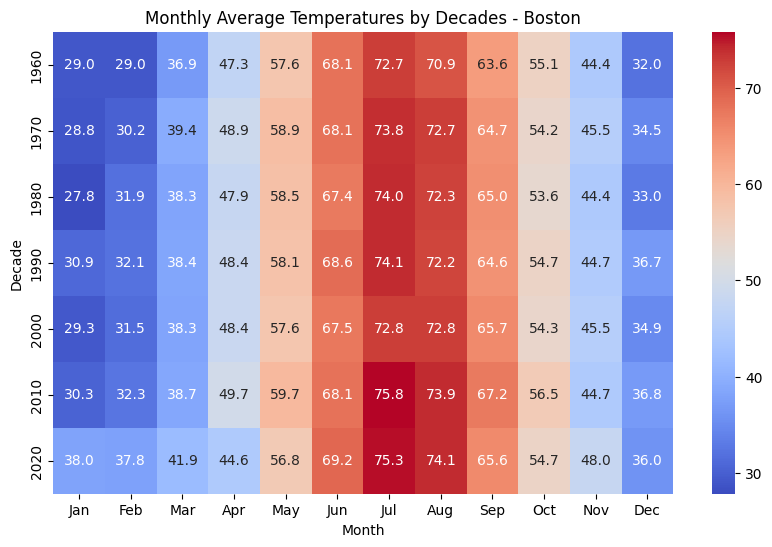

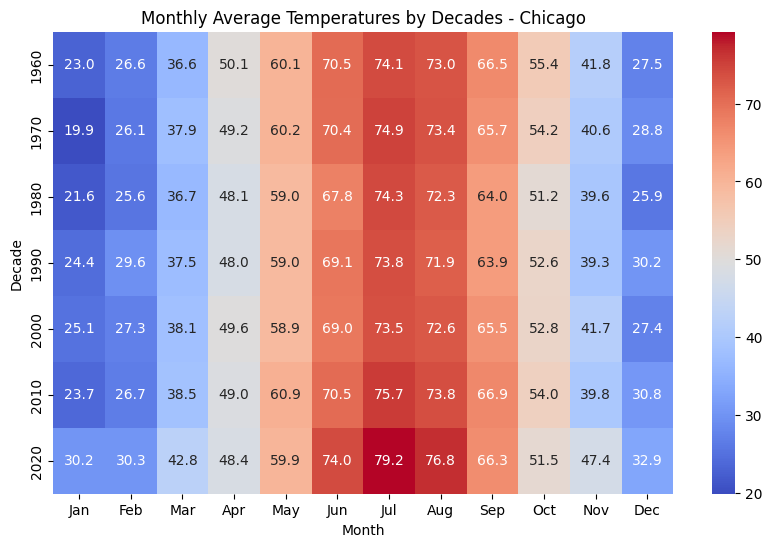

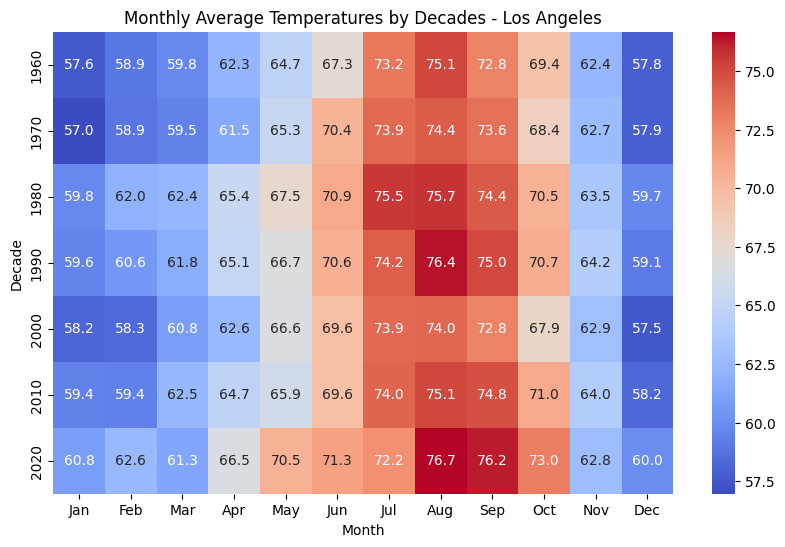

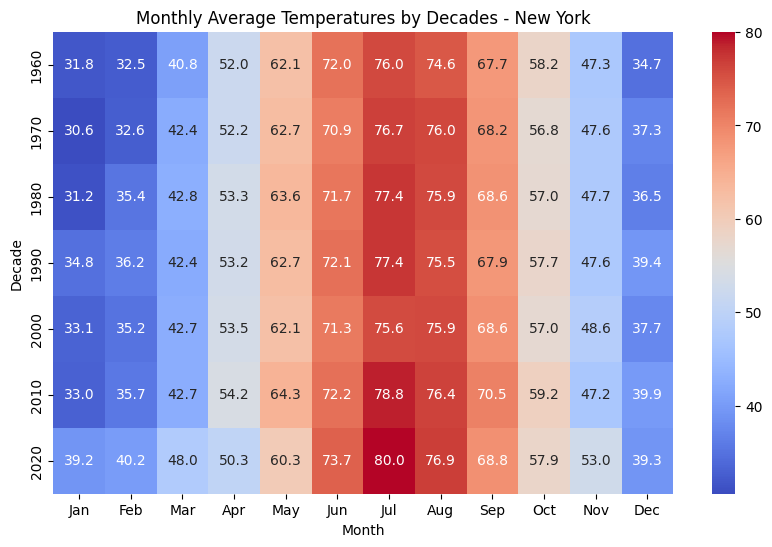

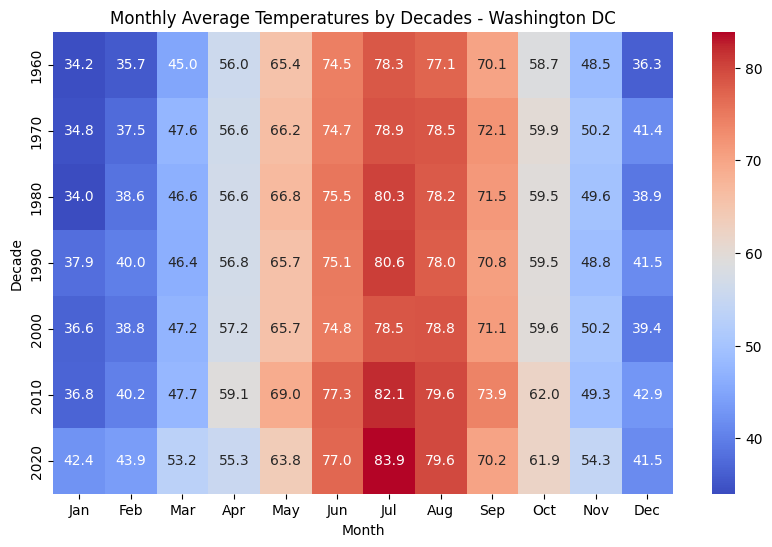

In [15]:
# Define the decades--Tạo danh sách các thập kỷ từ nhỏ nhất đến lớn nhất.
decades = range(df['Year'].min() // 10 * 10, df['Year'].max() // 10 * 10 + 1, 10)

# Define the order of months starting from January
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Iterate over each city
for city in cities:
    # Filter the data for the current city
    #Dùng .copy() để tránh lỗi SettingWithCopyWarning khi chỉnh sửa DataFrame
    city_data = df[df['City'] == city].copy()  # Make a copy of the filtered DataFrame

    # Group by decade and month, and calculate the average temperature
    #reset_index() để giữ lại dữ liệu dạng bảng
    city_data['Decade'] = city_data['Year'] // 10 * 10
    avg_by_decade = city_data.groupby(['Decade', 'Month']).mean(numeric_only=True).reset_index()

    # Pivot the table to reshape the data
    pivot_table = avg_by_decade.pivot(index='Decade', columns='Month', values='tavg')

    # Rearrange the columns
    pivot_table = pivot_table[month_order]

    # Set the size of the heatmap
    plt.figure(figsize=(10, 6))

    # Create the heatmap
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".1f", cbar=True)

    # Set the title and labels
    plt.title(f"Monthly Average Temperatures by Decades - {city}")
    plt.xlabel("Month")
    plt.ylabel("Decade")

    # Show the heatmap
    plt.show()

In [16]:
average_precipitation = df.groupby(['City', 'Year'])['prcp'].mean()
print(average_precipitation)

City           Year
Boston         1960    0.121475
               1961    0.131068
               1962    0.118438
               1963    0.095452
               1964    0.099645
                         ...   
Washington DC  2016    0.086612
               2017    0.097534
               2018    0.181589
               2019    0.116000
               2020    0.156667
Name: prcp, Length: 305, dtype: float64


In this task, you’ll create a separate plot for each city showing its average yearly precipitation. First, you’ll need to calculate the average precipitation for each city and year.

In [17]:
# Group the data by 'City' and 'Year' and calculate the average precipitation for each city and year
average_precipitation = df.groupby(['City', 'Year'])['prcp'].mean()
for city in cities:
     # Filter the data for the current city
    city_data = average_precipitation[city]
    print(city_data)

Year
1960    0.121475
1961    0.131068
1962    0.118438
1963    0.095452
1964    0.099645
          ...   
2016    0.090301
2017    0.119041
2018    0.146082
2019    0.138027
2020    0.102568
Name: prcp, Length: 61, dtype: float64
Year
1960    0.076066
1961    0.117534
1962    0.060877
1963    0.076767
1964    0.073634
          ...   
2016    0.098279
2017    0.118082
2018    0.134877
2019    0.135726
2020    0.107158
Name: prcp, Length: 61, dtype: float64
Year
1960    0.026148
1961    0.015973
1962    0.042110
1963    0.033726
1964    0.021803
          ...   
2016    0.032240
2017    0.036274
2018    0.024274
2019    0.059041
2020    0.026803
Name: prcp, Length: 61, dtype: float64
Year
1960    0.126749
1961    0.107726
1962    0.101781
1963    0.093918
1964    0.090137
          ...   
2016    0.115219
2017    0.123397
2018    0.179589
2019    0.145288
2020    0.123907
Name: prcp, Length: 61, dtype: float64
Year
1960    0.100984
1961    0.114904
1962    0.090603
1963    0.107781
196

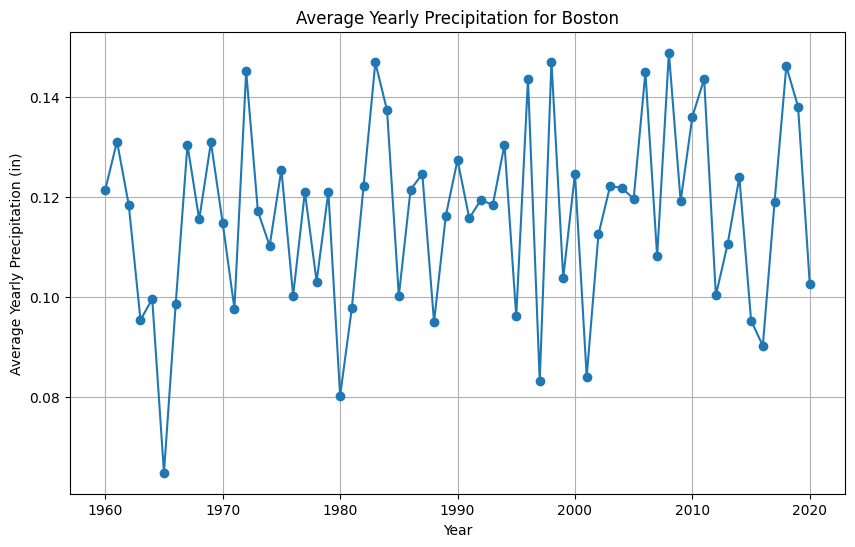

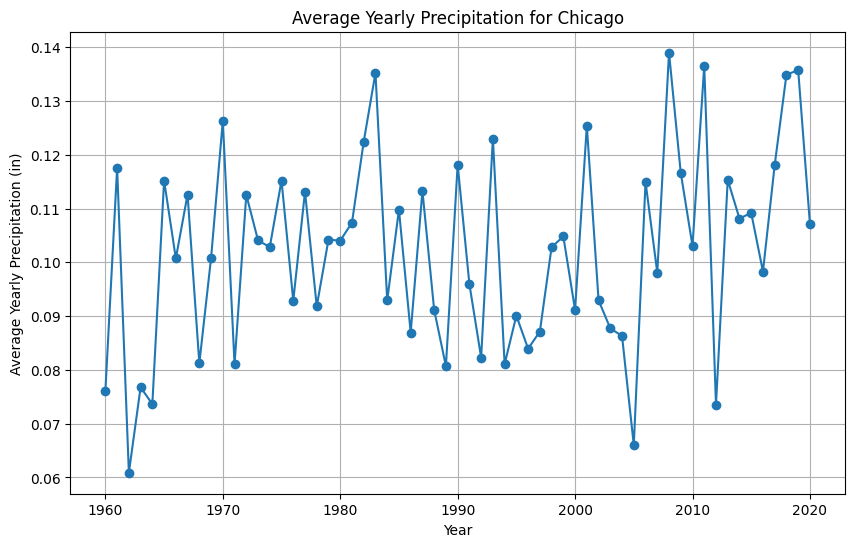

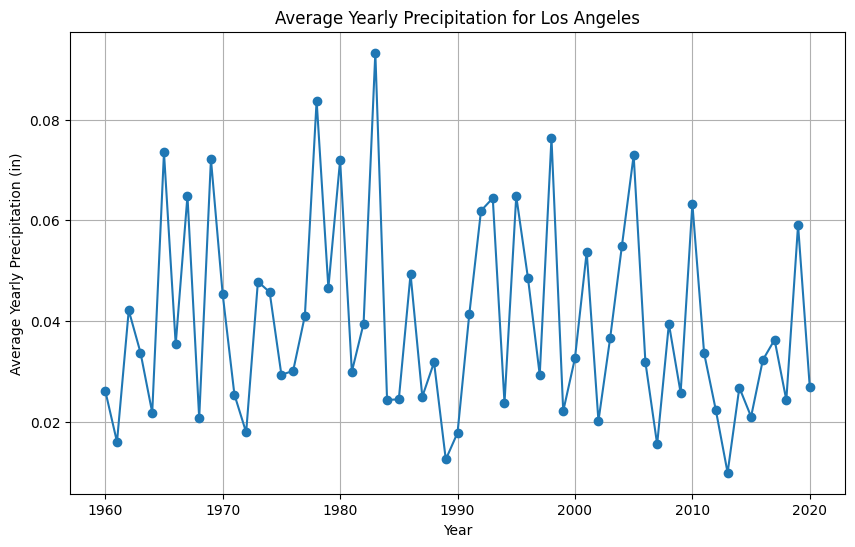

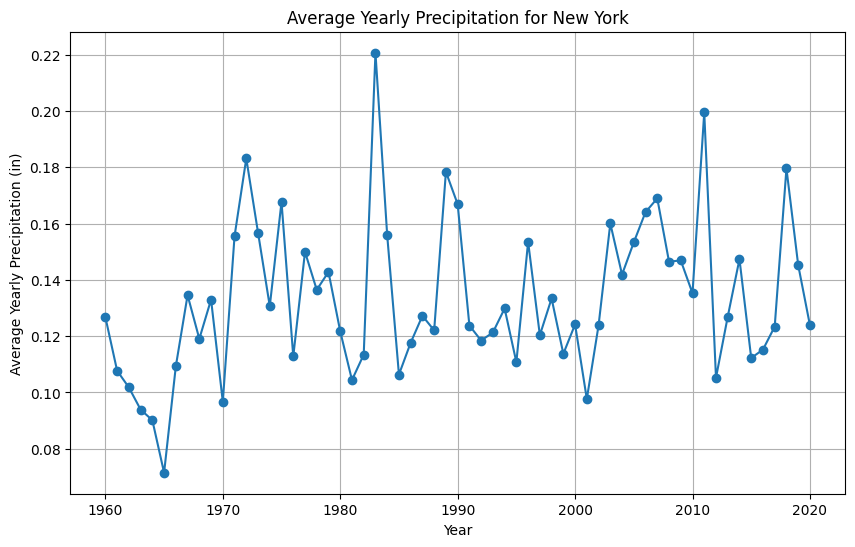

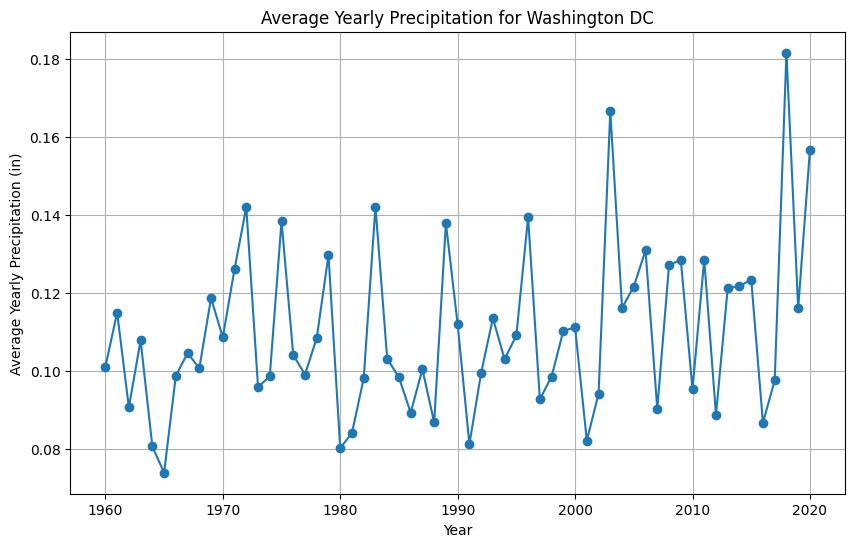

In [18]:
# Group the data by 'City' and 'Year' and calculate the average precipitation for each city and year
average_precipitation = df.groupby(['City', 'Year'])['prcp'].mean()
for city in cities:
     # Filter the data for the current city
    city_data = average_precipitation[city]

     # Create a list of years for the x-axis
    years = city_data.index.tolist()

     # Create a list of average precipitation values for the y-axis
    averages = city_data.tolist()

    # Set the graph size
    plt.figure(figsize=(10, 6))

    # Plot the average yearly precipitation for the current city
    plt.plot(years, averages, marker='o')

    # Set the x-axis label, y-axis label, and plot title
    plt.xlabel('Year')
    plt.ylabel('Average Yearly Precipitation (in)')
    plt.title(f'Average Yearly Precipitation for {city}')

    # Display the plot
    plt.grid(True)
    plt.show()




Code này thực hiện việc vẽ biểu đồ nhiệt độ theo thời gian cho từng thành phố, đồng thời hiển thị đường trung bình động (moving average) 30 ngày bằng thư viện Plotly.



In this task, you’ll create a separate graph for each city showing the original temperature data and the moving average. This will be useful for visualizing trends, identifying seasonality, comparing cities, analyzing anomalies, and effectively communicating insights about temperature patterns and changes over time.

In [19]:
#Ở đây, rolling_window_size = 30 có nghĩa là ta sẽ tính trung bình động của dữ liệu trong 30 điểm dữ liệu gần nhất (thường là 30 ngày nếu dữ liệu theo ngày).
#Duyệt qua cột tavg (nhiệt độ trung bình).
#Tính trung bình của 30 ngày gần nhất cho mỗi điểm dữ liệu.
#Giá trị đầu tiên sẽ là NaN cho đến khi có đủ 30 điểm dữ liệu.
# Set the rolling window size for the moving average
import plotly.graph_objects as go

rolling_window_size = 30

# Create a separate plot for each city
for city in cities:
    # Filter the data for the specific city
    city_data = df[df["City"] == city].copy()

    # Calculate the moving average of the 'tavg' column
    city_data['tavg_ma'] = city_data['tavg'].rolling(rolling_window_size).mean()

    # Create a plotly figure
    fig = go.Figure()

    # Add traces for the original temperature data and moving average
    fig.add_trace(go.Scatter(x=city_data['Date'], y=city_data['tavg'], mode='lines', name='Original Temperature'))
    fig.add_trace(go.Scatter(x=city_data['Date'], y=city_data['tavg_ma'], mode='lines', name='Moving Average'))

    # Configure the layout
    fig.update_layout(
        title=f'Temperature Data and Moving Average for {city}',
        xaxis_title='Date',
        yaxis_title='Temperature (°F)',
        hovermode='x',
        legend=dict(x=0.7, y=0.9),
        template='plotly_white'
    )

    # Show the interactive plot
    fig.show()

Now that you’ve analyzed the climate change patterns over the last six decades for the five cities, it’s time to switch gears to weather forecasting. You’ll use Prophet, a time series forecasting library developed by Facebook, for making weather forecasts. To do so, you’ll need to prepare the required data to use the library.

In [20]:

#Tạo một DataFrame mới từ df cũ, chỉ giữ lại các cột 'Date', 'tavg', và 'City'.
# Select the relevant columns
df = pd.DataFrame(df, columns=['Date', 'tavg', 'City'])

# Rename the columns
df.rename(columns={"Date": "ds", "tavg": "y"}, inplace=True)

Now that you’ve prepared the required data, it’s time to use the Prophet library to make weather forecasts for the next five years for each city.

DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/p622tbkl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/6asr5k_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4237', 'data', 'file=/tmp/tmp723_jjs6/p622tbkl.json', 'init=/tmp/tmp723_jjs6/6asr5k_k.json', 'output', 'file=/tmp/tmp723_jjs6/prophet_model3wfkn189/prophet_model-20250305082152.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:21:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:21:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

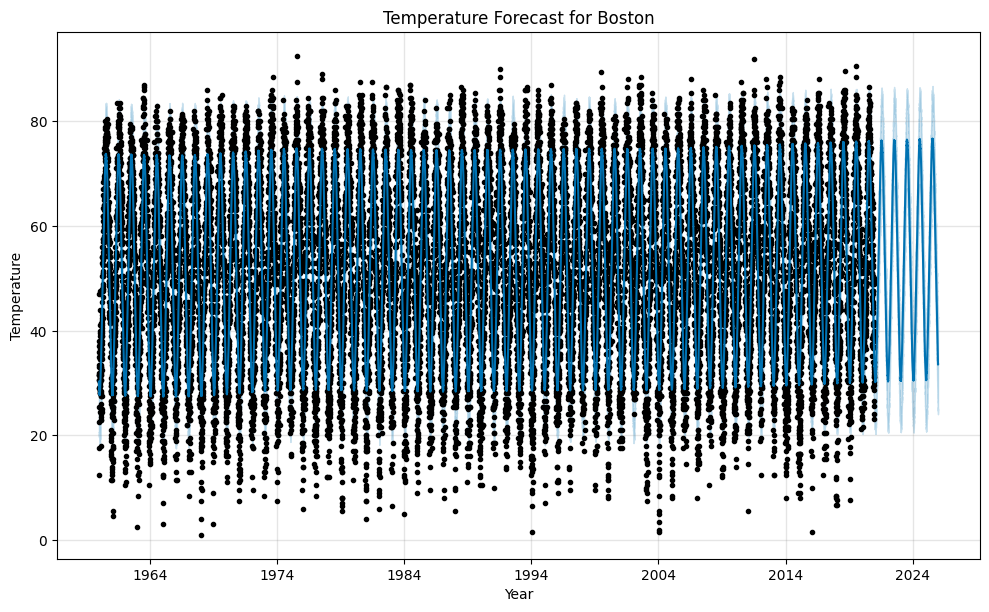

DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/evl7_fp0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/ejo3nor2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66472', 'data', 'file=/tmp/tmp723_jjs6/evl7_fp0.json', 'init=/tmp/tmp723_jjs6/ejo3nor2.json', 'output', 'file=/tmp/tmp723_jjs6/prophet_model_lqte_ht/prophet_model-20250305082209.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:22:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:22:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


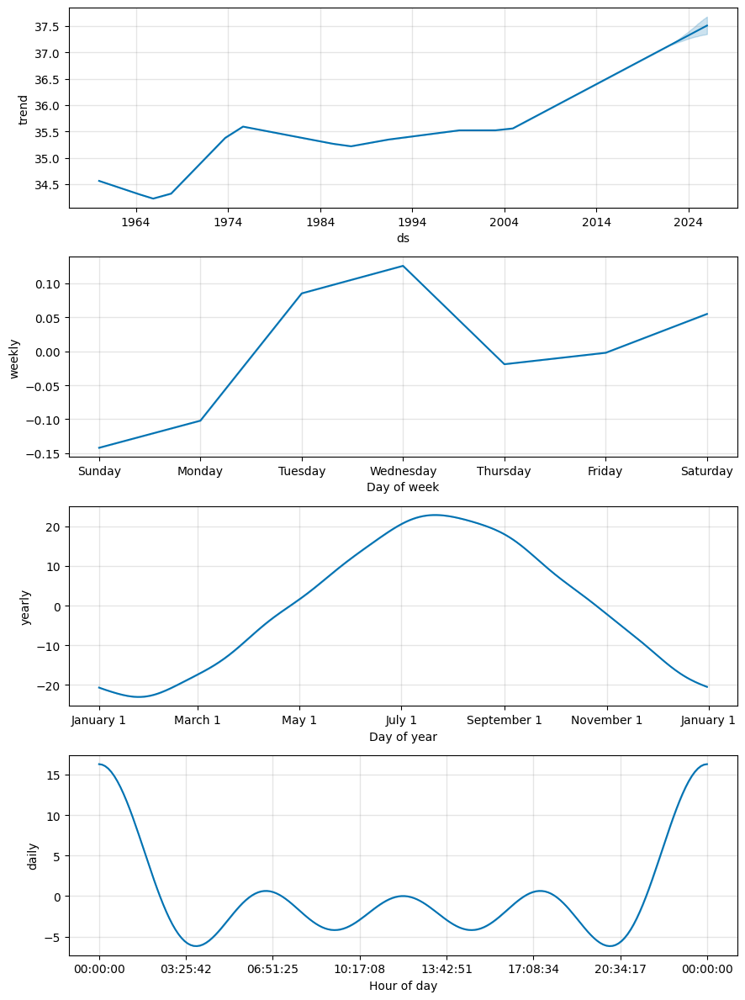

<Figure size 1000x600 with 0 Axes>

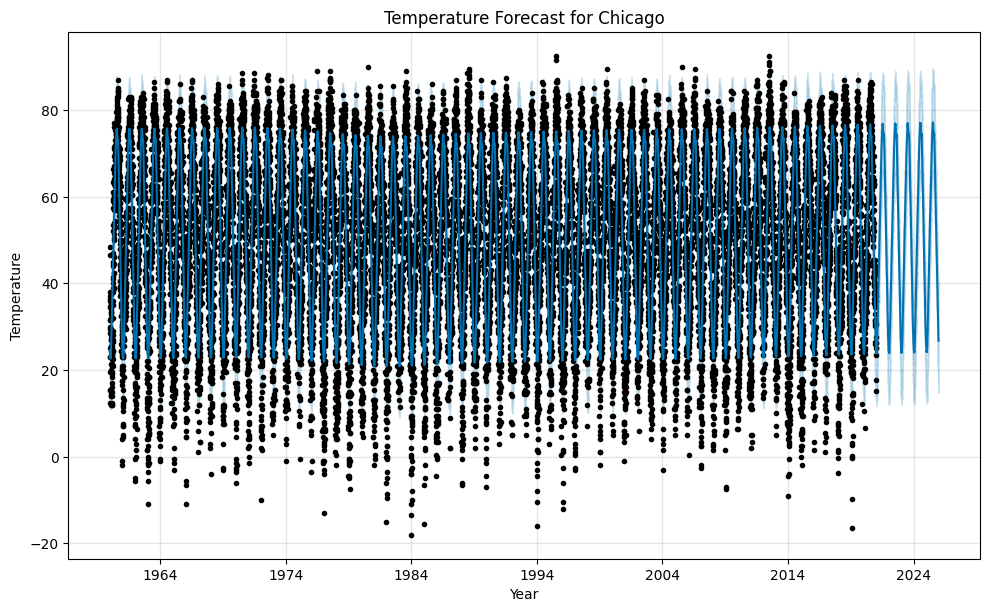

DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/gy5i1ch7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/20hpa8a7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70333', 'data', 'file=/tmp/tmp723_jjs6/gy5i1ch7.json', 'init=/tmp/tmp723_jjs6/20hpa8a7.json', 'output', 'file=/tmp/tmp723_jjs6/prophet_model248b4j_m/prophet_model-20250305082223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:22:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:22:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


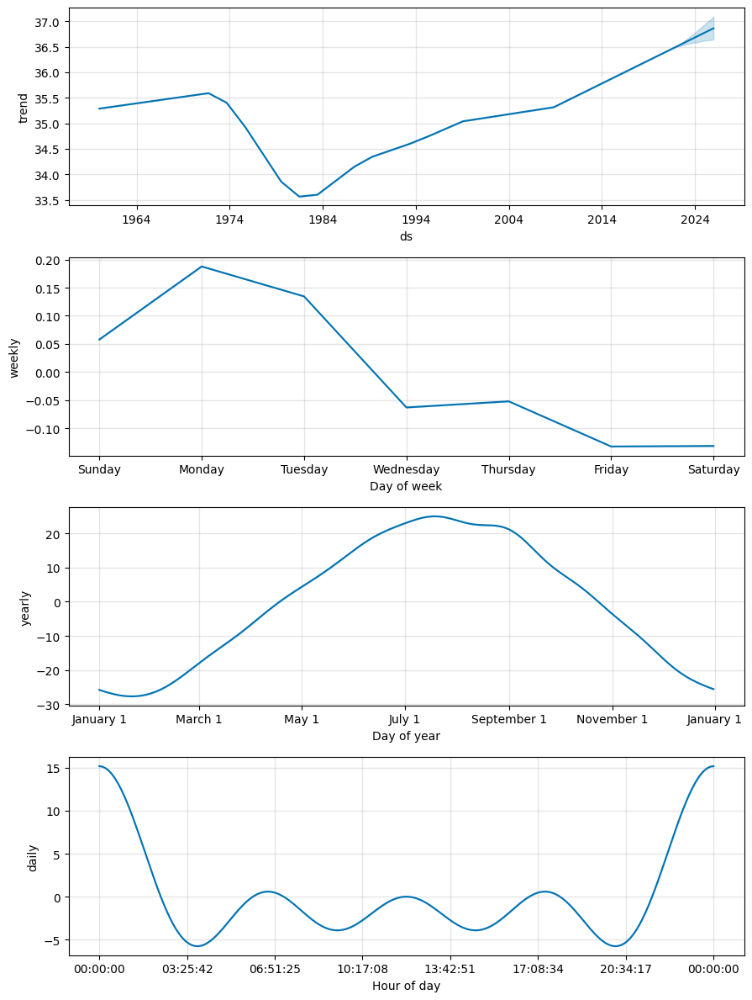

<Figure size 1000x600 with 0 Axes>

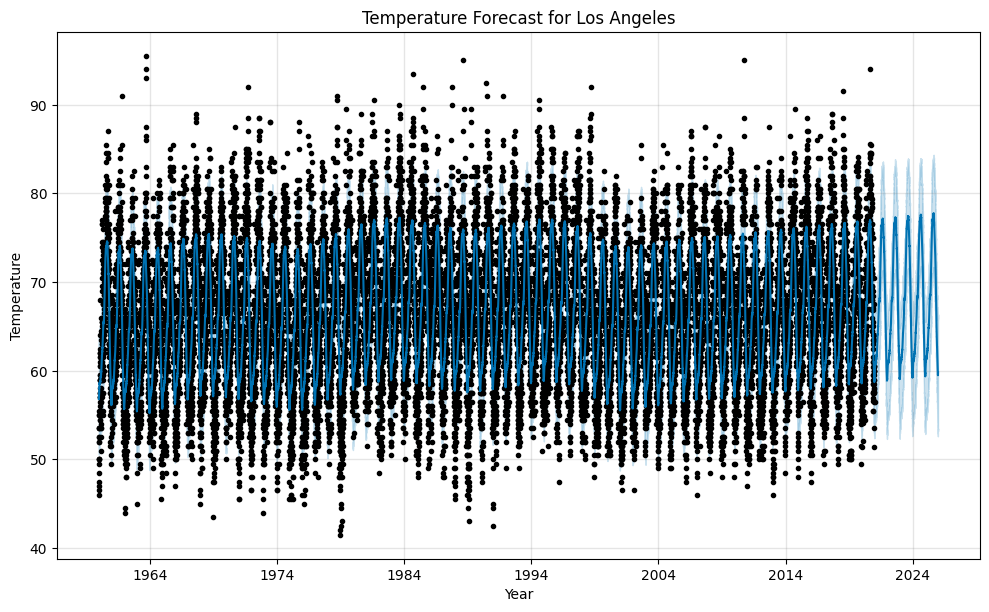

DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/d0bi643d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/zdludj4j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23088', 'data', 'file=/tmp/tmp723_jjs6/d0bi643d.json', 'init=/tmp/tmp723_jjs6/zdludj4j.json', 'output', 'file=/tmp/tmp723_jjs6/prophet_model6_x7sxq1/prophet_model-20250305082241.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:22:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:22:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


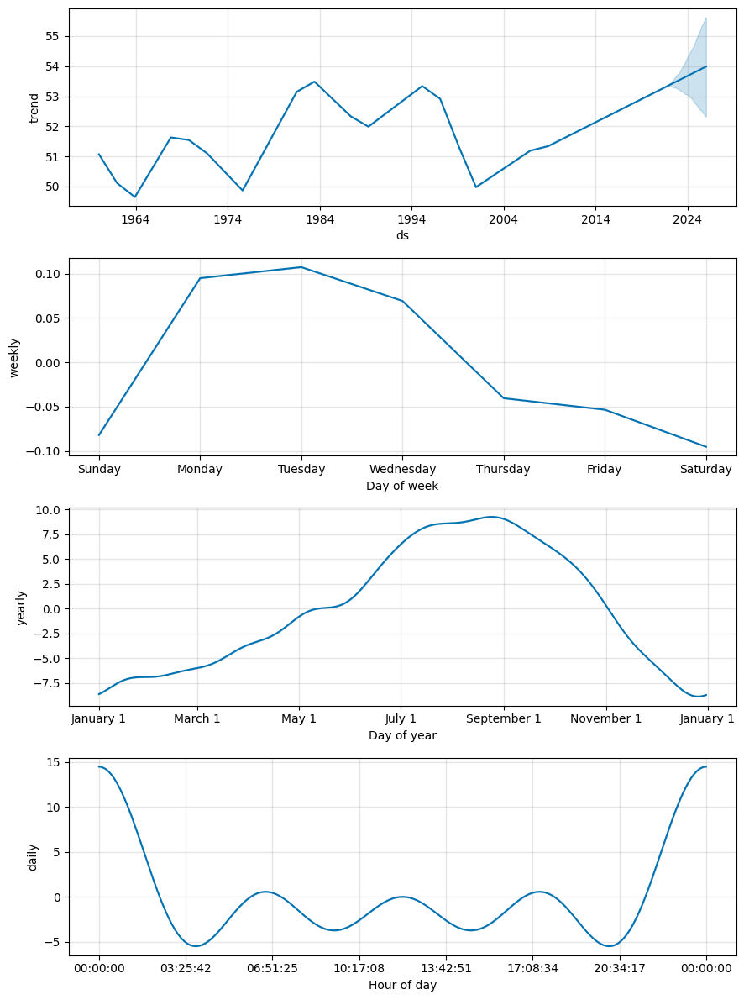

<Figure size 1000x600 with 0 Axes>

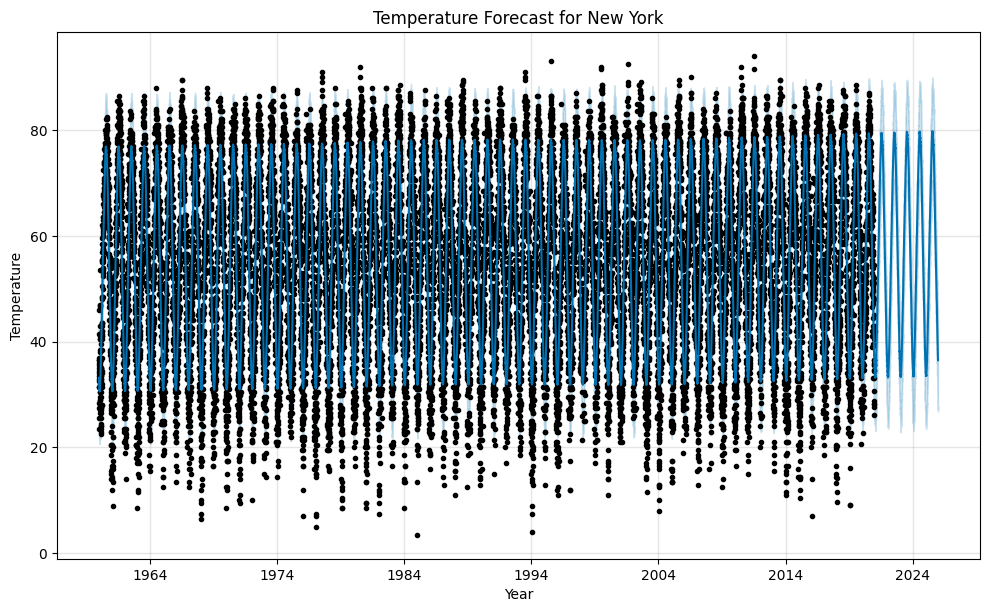

DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/psq7xyjt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp723_jjs6/ob0t5ieq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4381', 'data', 'file=/tmp/tmp723_jjs6/psq7xyjt.json', 'init=/tmp/tmp723_jjs6/ob0t5ieq.json', 'output', 'file=/tmp/tmp723_jjs6/prophet_modelsx0s0s4x/prophet_model-20250305082255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:22:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:23:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


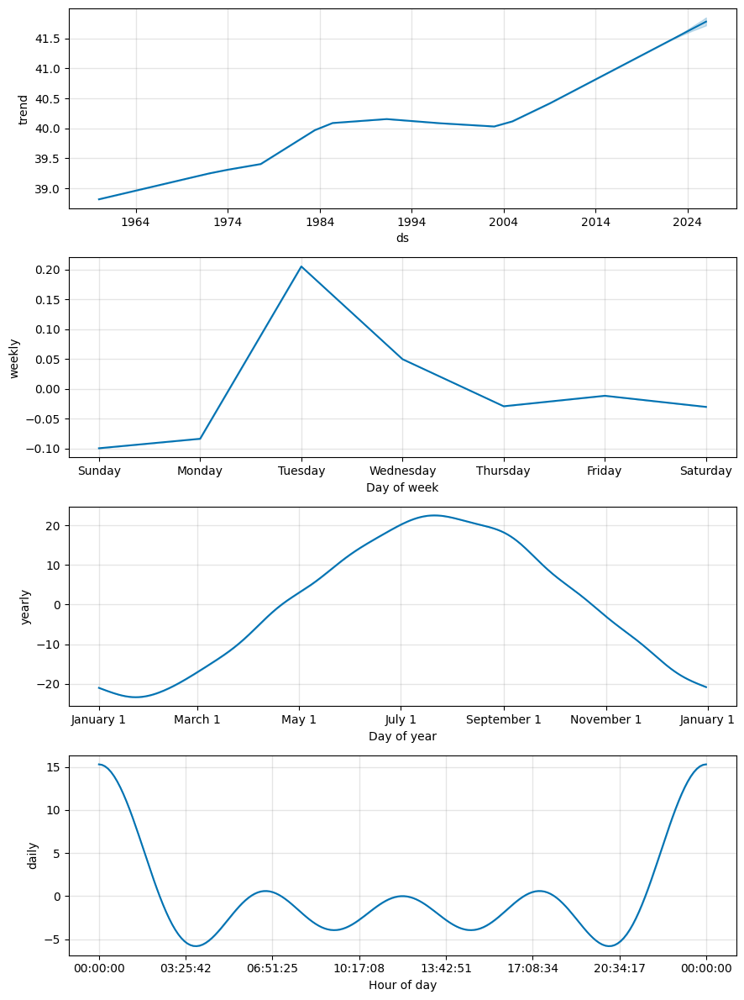

<Figure size 1000x600 with 0 Axes>

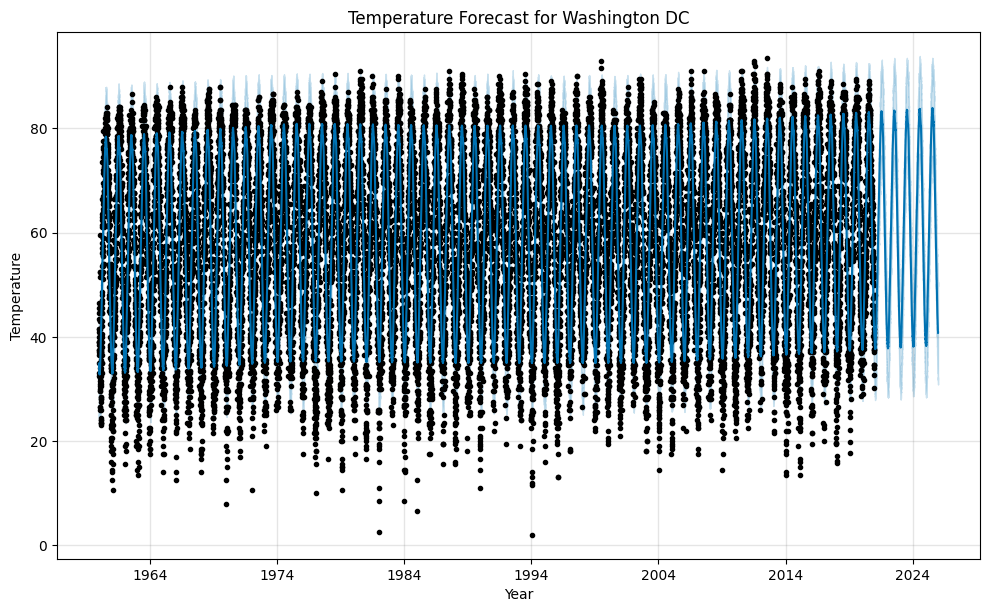

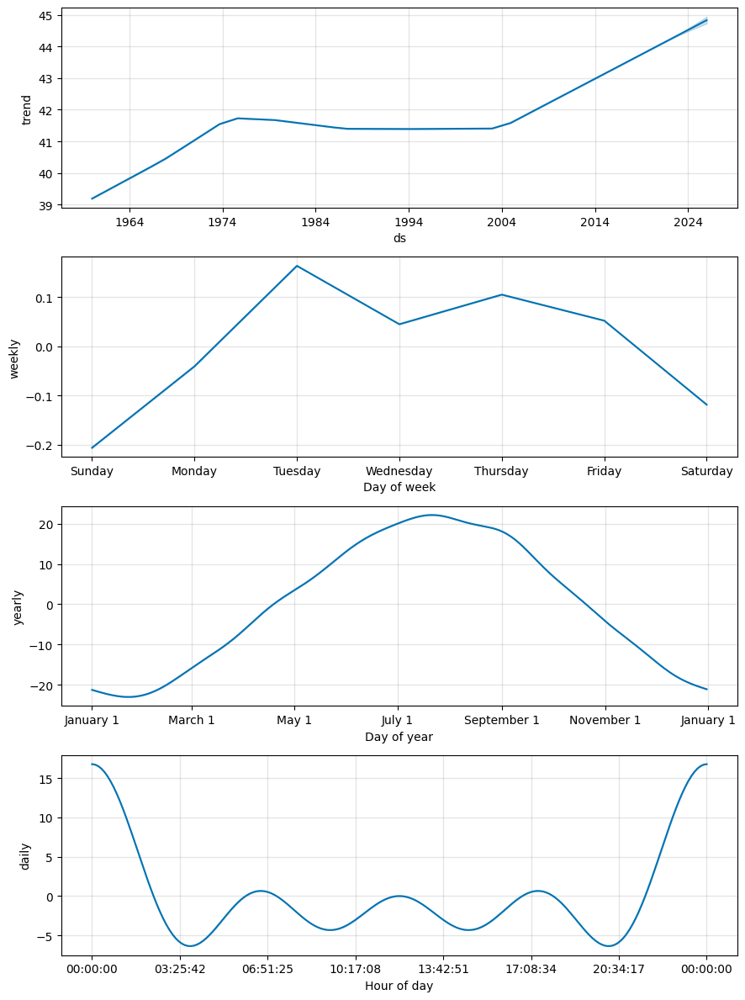

In [21]:
# Iterate over each city and create a separate graph for each
for city in cities:
    # Filter the data for the current city
    city_data = df[df['City'] == city]

    # Create a Prophet model
    model = Prophet(daily_seasonality=True)

    # Fit the model with the city-specific data
    model.fit(city_data)

    # Generate future dates for prediction (next five years)
    future_dates = model.make_future_dataframe(periods=365*5)

    # Make predictions for the future dates
    forecast = model.predict(future_dates)

    # Set the graph size
    plt.figure(figsize=(10, 6))

    # Plot the overall trend
    model.plot(forecast, xlabel='Year', ylabel='Temperature')

    # Set the plot title
    plt.title(f'Temperature Forecast for {city}')

    # Display the plot
    plt.show()

    # Plot the components: trend, yearly seasonality, and weekly seasonality
    fig = model.plot_components(forecast)

Congratulations on completing this project on climate change analysis and weather prediction! You’ve done an excellent job. Applying your skills with hands-on projects like this is a great way to get comfortable with new techniques and technologies.

In this project, you used the historical daily temperature and precipitation data to study and analyze patterns of climate change over a 60-year period from 1960 to 2020. Furthermore, you also made weather predictions for the next five years using Facebook’s Prophet library.

Feel free to use the remaining dataset that you didn’t use in this project to explore additional analyses, such as comparing temperature trends across different years or seasons, investigating correlations between temperature and other variables (e.g., precipitation), examining long-term climate change patterns, or exploring specific events or phenomena related to climate change. By delving deeper into the dataset, you can gain a more comprehensive understanding of climate dynamics and contribute to the broader understanding of climate change.